In [1]:
import numpy as np
import numpy.ma as ma
import scipy.stats
import netCDF4

import matplotlib.patches
import matplotlib.gridspec
import datetime

from matplotlib.patches import Ellipse, Polygon #https://stackoverflow.com/questions/38168948/how-to-decouple-hatch-and-edge-color-in-matplotlib/38169221

import matplotlib.pyplot as plt
%matplotlib inline

degree_sign = '\N{DEGREE SIGN}'

import cartopy.crs as ccrs

from scipy.io import savemat  #####To save as .mat

import numpy.matlib

import scipy.linalg as la

import scipy.sparse.linalg as sparse

import pickle #######For saving dictionaries https://stackoverflow.com/questions/11218477/how-can-i-use-pickle-to-save-a-dict
import bottleneck as bn #### For running mean https://stackoverflow.com/questions/13728392/moving-average-or-running-mean

import time as time_seconds

### Cristian Martinez-Villalobos, April 20, 2023

#### Clase 6 "Ciencia de Datos para Análisis de Cambio Climático"

In [190]:
###### This calculates the monthly mean in each lat/lon grid point

def monthly_mean(timeserie,lat,lon): ####Needs to be of length multiple of 365
    monthly_mean=np.zeros((12,len(lat),len(lon)))
    t0=time_seconds.perf_counter()
    for j in range(0,len(lon)):
        for i in range(0,len(lat)):
            for k in range(0,12):
                monthly_mean[k,i,j]=np.mean(timeserie[k:-1:12,i,j])
        t1=time_seconds.perf_counter()
        if j%20==0:
            print(100*(j+1)/len(lon),'% ',t1-t0,'s')  ####To check how long it takes
        
    return monthly_mean

In [3]:
####Define function to remove seasonal cycle
def seas_cycle_fit(seas_cycle): #### array (12,) with the mean each day
    y=np.zeros([1,len(seas_cycle)]) #1xlength(bin)
    x=np.zeros([5,len(seas_cycle)])  ##Predictors 3xbin
    t=np.arange(1,12.1)

    y[0,:]=seas_cycle
    x[0,:]=np.ones(seas_cycle.shape)
    x[1,:]=np.cos(2*np.pi*t/12)
    x[2,:]=np.sin(2*np.pi*t/12)
    x[3,:]=np.cos(4*np.pi*t/12)
    x[4,:]=np.sin(4*np.pi*t/12)

    coeff=y.dot(np.linalg.pinv(x))
    seas_cycle_fit=np.squeeze(np.matmul(coeff,x))
     
    return seas_cycle_fit ###Returns (array (365,)) with seasonal cycle fitted with two harmonics.

#### Patrones Espaciales Asociados a Modos de Variabilidad Climáticos

##### En estos ejemplos graficaremos los patrones de temperatura superficial del mar y vientos asociados con el fenómeno de El Niño

In [4]:
#### Pasos:
#### 1. Calcularemos un índice asociado a El Niño (ver clase pasada)
#### 2. Calcularemos el patrón espacial asociado a este índice usando "Composite Analysis"
#### 3. Calcularemos el patrón espacial asociado a este índice usando Regresión Lineal
#### 4. Compararemos las similitudes y diferencias de usar estos dos métodos

### PARTE 1

#### Cargamos la temperatura superficial del mar y vientos zonales y meridionales

In [4]:
### In case we want seasonal data

#season='DJF'; months=[12,1,2]
#season='MAM'; months=[3,4,5]
#season='JJA'; months=[6,7,8]
#season='SON'; months=[9,10,11]
season='annual'; months=[1,2,3,4,5,6,7,8,9,10,11,12]

#### Initial, final year of analysis

In [191]:
year_init=1948
year_fin=2022

#### Load SST from 1948 to 2022

In [192]:
####Here we load the whole file
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P1/' #### Replace with folder where file is located
filename='slp.mon.mean.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

slp = ncfile.variables['slp'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')  #####This is to check how long it takes

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    description: Data is from NMC initialized reanalysis
(4x/day).  These are the 0.9950 sigma level values.
    platform: Model
    Conventions: COARDS
    NCO: 20121012
    history: Thu May  4 18:12:35 2000: ncrcat -d time,0,622 /Datasets/ncep.reanalysis.derived/surface/slp.mon.mean.nc ./surface/slp.mon.mean.nc
Mon Jul  5 23:22:35 1999: ncrcat slp.mon.mean.nc /Datasets/ncep.reanalysis.derived/surface/slp.mon.mean.nc /dm/dmwork/nmc.rean.ingest/combinedMMs/slp.mon.mean.nc
/home/hoop/crdc/cpreanjuke2farm/cpreanjuke2farm Thu Oct 26 23:42:16 1995 from pre.sig995.85.nc
created 95/02/06 by Hoop (netCDF2.3)
Converted to chunked, deflated non-packed NetCDF4 2014/09
    title: monthly mean slp from the NCEP Reanalysis
    dataset_title: NCEP-NCAR Reanalysis 1
    References: http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis.derived.html
    dimensions(sizes): lat(73), lon(144), time(903)
    v

#### Load zonal wind from 1948 to 2022 (viento zonal= de oeste a este)

In [193]:
####Here we load the whole file
t0=time_seconds.perf_counter()

file_root='Arch_P1/' #### Replace with folder where file is located
filename='uwnd.mon.mean.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

uwnd = ncfile.variables['uwnd'][time_indices,0,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')  #####This is to check how long it takes

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    title: monthly mean u wind from the NCEP Reanalysis
    description: Data from NCEP initialized reanalysis (4x/day).  These are interpolated to pressure surfaces from model (sigma) surfaces
    platform: Model
    Conventions: COARDS
    NCO: 20121012
    history: Mon Jul  5 22:36:33 1999: ncrcat uwnd.mon.mean.nc /Datasets/ncep.reanalysis.derived/pressure/uwnd.mon.mean.nc /dm/dmwork/nmc.rean.ingest/combinedMMs/uwnd.mon.mean.nc
Made bt Cathy Smith 12/5/95 
(netCDF2.3)
Converted to chunked, deflated non-packed NetCDF4 2014/09
    dataset_title: NCEP-NCAR Reanalysis 1
    References: http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis.derived.html
    dimensions(sizes): level(17), lat(73), lon(144), time(903)
    variables(dimensions): float32 level(level), float32 lat(lat), float32 lon(lon), float64 time(time), float32 uwnd(time, level, lat, lon)
    groups: 
1.1934096610002598 s


#### Load meridional wind from 1948 to 2022 (viento meridional = de sur a norte)

In [194]:
####Here we load the whole file
t0=time_seconds.perf_counter()

file_root='Arch_P1/' #### Replace with folder where file is located
filename='vwnd.mon.mean.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

vwnd = ncfile.variables['vwnd'][time_indices,0,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')  #####This is to check how long it takes

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    title: monthly mean v wind from the NCEP Reanalysis
    description: Data from NCEP initialized reanalysis (4x/day).  These are interpolated to pressure surfaces from model (sigma) surfaces
    platform: Model
    Conventions: COARDS
    NCO: 20121012
    history: Mon Jul  5 22:51:19 1999: ncrcat vwnd.mon.mean.nc /Datasets/ncep.reanalysis.derived/pressure/vwnd.mon.mean.nc /dm/dmwork/nmc.rean.ingest/combinedMMs/vwnd.mon.mean.nc
created by Cathy Smith 12/5/95
created 95/02/06 by Hoop (netCDF2.3)
Converted to chunked, deflated non-packed NetCDF4 2014/09
    dataset_title: NCEP-NCAR Reanalysis 1
    References: http://www.psl.noaa.gov/data/gridded/data.ncep.reanalysis.derived.html
    dimensions(sizes): level(17), lat(73), lon(144), time(903)
    variables(dimensions): float32 level(level), float32 lat(lat), float32 lon(lon), float64 time(time), float32 vwnd(time, level, lat, lon)
    groups: 

In [9]:
slp.shape

(900, 73, 144)

##### Calculate anomalies with respect to seasonal cycle 

In [10]:
vwnd.shape

(900, 73, 144)

In [195]:
#### This function calculates seasonal cycle
mean_monthly_slp=monthly_mean(slp,lat,lon)
mean_monthly_uwnd=monthly_mean(uwnd,lat,lon)
mean_monthly_vwnd=monthly_mean(vwnd,lat,lon)

0.6944444444444444 %  0.16666542400162143 s
14.583333333333334 %  3.196498840001368 s
28.47222222222222 %  5.6733926520009845 s
42.361111111111114 %  8.242057661000217 s
56.25 %  10.824507956000161 s
70.13888888888889 %  13.336292095000317 s
84.02777777777777 %  15.96698769500108 s
97.91666666666667 %  18.514355182000145 s
0.6944444444444444 %  0.11186163899947132 s
14.583333333333334 %  2.5717412089998106 s
28.47222222222222 %  5.149471697999616 s
42.361111111111114 %  7.78524191500037 s
56.25 %  10.295336847000726 s
70.13888888888889 %  12.848425801999838 s
84.02777777777777 %  15.42589894699995 s
97.91666666666667 %  17.972454664000907 s
0.6944444444444444 %  0.11380600899974525 s
14.583333333333334 %  2.624197159000687 s
28.47222222222222 %  5.163076521999756 s
42.361111111111114 %  7.718909711000379 s
56.25 %  10.295778925999912 s
70.13888888888889 %  12.783901533999597 s
84.02777777777777 %  15.269472855001368 s
97.91666666666667 %  17.800415195000824 s


In [196]:
##3## Hacemos un fit al ciclo estacional removiendo los dos primeros harmònicos de Fourier
mean_monthly_slp_fit_tem=np.zeros(mean_monthly_slp.shape)
mean_monthly_uwnd_fit_tem=np.zeros(mean_monthly_uwnd.shape)
mean_monthly_vwnd_fit_tem=np.zeros(mean_monthly_vwnd.shape)

t0=time_seconds.perf_counter()
for j in range(0,len(lon)): 
    for i in range(0,len(lat)):
        mean_monthly_slp_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_slp[:,i,j])
        mean_monthly_uwnd_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_uwnd[:,i,j])
        mean_monthly_vwnd_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_vwnd[:,i,j])
    t1=time_seconds.perf_counter()
    if j%20==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')

0.6944444444444444 %  0.06118867300028796 s
14.583333333333334 %  1.2733227550015727 s
28.47222222222222 %  2.76671206500032 s
42.361111111111114 %  3.7054554920014198 s
56.25 %  4.417611419001332 s
70.13888888888889 %  5.533987242000876 s
84.02777777777777 %  6.68529883500014 s
97.91666666666667 %  7.268889421000495 s


#### Hacemos copias de N_years=75 (1948-2022) años

In [13]:
#### Make N_years copies (N_years= repleace with number of years of the dataset. For monthly data this is len(timeseries[:,0,0])/12)
N_years=int(year_fin-year_init+1)
mean_monthly_slp_fit=np.zeros(slp.shape)
mean_monthly_uwnd_fit=np.zeros(uwnd.shape)
mean_monthly_vwnd_fit=np.zeros(vwnd.shape)

for i in range(0,N_years):
    mean_monthly_slp_fit[12*i:12*(i+1),:,:]=mean_monthly_slp_fit_tem
    mean_monthly_uwnd_fit[12*i:12*(i+1),:,:]=mean_monthly_uwnd_fit_tem
    mean_monthly_vwnd_fit[12*i:12*(i+1),:,:]=mean_monthly_vwnd_fit_tem

#### Plot to check whether seasonal cycle is well calculated

Text(0.5, 1.0, 'Ciclo estacional meridional wind')

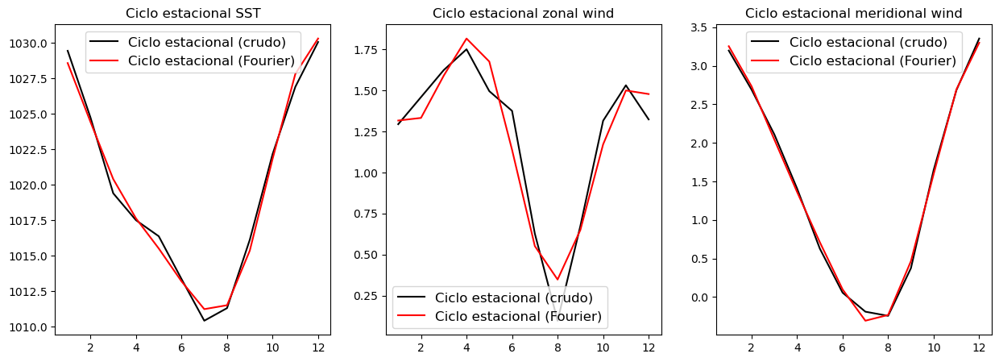

In [14]:
### chequeamos en un punto cualquiera

i=20
j=30
k=13

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1,3,1)
ax.plot(np.arange(1,12.1),mean_monthly_slp[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_slp_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional SST')

ax = fig.add_subplot(1,3,2)
ax.plot(np.arange(1,12.1),mean_monthly_uwnd[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_uwnd_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional zonal wind')

ax = fig.add_subplot(1,3,3)
ax.plot(np.arange(1,12.1),mean_monthly_vwnd[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_vwnd_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional meridional wind')

#### Calculamos anomalìas removiendo el ciclo estacional

In [182]:
#### SSTA, UA, and VA are sea surface temperature, zonal wind, and meridional wind anomalies at each point of the grid respect to their respective seasonal cyles

SLP=slp-mean_monthly_slp_fit
UA=uwnd-mean_monthly_uwnd_fit
VA=vwnd-mean_monthly_vwnd_fit

#### Calculamos el índice Niño 3.4

In [197]:
lat_lo=30; lat_hi = 40; lon_lo = 220; lon_hi = 250; 

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

SLP_ni=SLP[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_N=np.mean(np.mean(SLP_ni,axis=2),axis=1)

np.std(SAM_N)

1.6454066761279846

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_N')

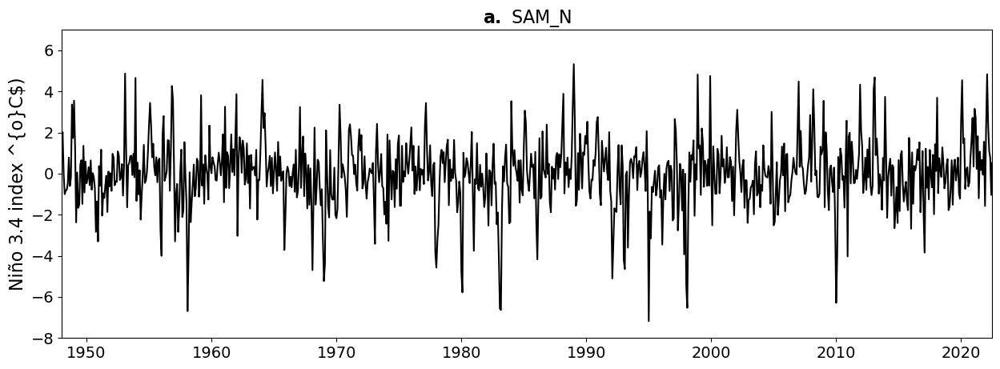

In [17]:
fontsize=16

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_N, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'Niño 3.4 index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-8,7)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_N' , fontsize=16)

In [18]:
lat_lo=60; lat_hi = 70; lon_lo = 250; lon_hi = 280; 

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

SLP_ni=SLP[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_S=np.mean(np.mean(SLP_ni,axis=2),axis=1)

np.std(SAM_S)

2.8181964156200876

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_S')

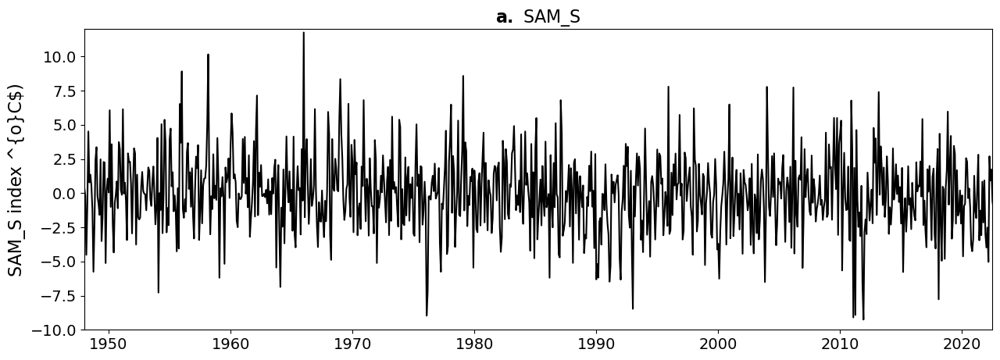

In [19]:
fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_S, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM_S index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-10,12)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_S' , fontsize=16)

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM')

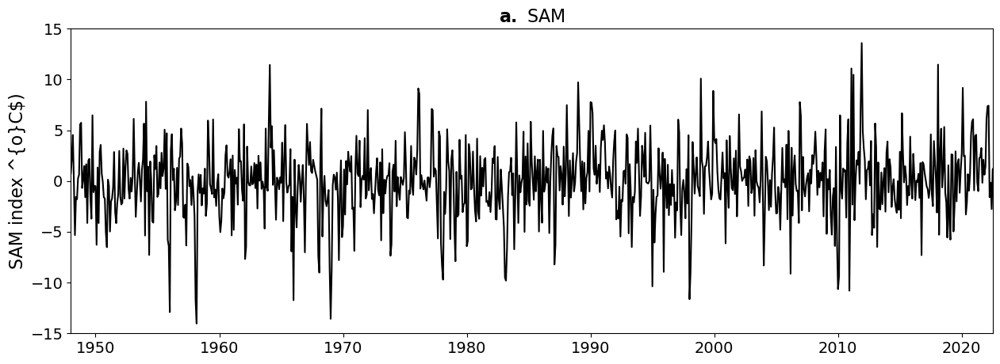

In [21]:
SAM = SAM_N - SAM_S

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-15,15)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM' , fontsize=16)

#### 2. Calculamos patrón espacial (Composite Analysis)

##### Usaremos el criterio que una anomalía del índice Niño 3.4 >0.5C corresponde a El Niño, <-0.5C corresponde a La Niña, y el resto es un estado neutral

#### El Niño composite, La Niña composite and Neutral composite

In [24]:
desv = np.std(SAM)*0.8

In [178]:
I_nino=np.argwhere(SAM>=desv)
I_nina=np.argwhere(SAM<=-desv)
I_neutral=np.argwhere((SAM>-desv) & (SAM<desv))

SLP_nino=np.squeeze(SLP[I_nino,:,:]) #### Seleccionamos sólo los meses con SAM>desv (note: np.squeeze removes singleton dimension)
UA_nino=np.squeeze(UA[I_nino,:,:]) #### Seleccionamos sólo los meses con SAM>desv (note: np.squeeze removes singleton dimension)
VA_nino=np.squeeze(VA[I_nino,:,:]) #### Seleccionamos sólo los meses con SAM>desv (note: np.squeeze removes singleton dimension)

SLP_nina=np.squeeze(SLP[I_nina,:,:]) #### Seleccionamos sólo los meses con SAM>-desv (note: np.squeeze removes singleton dimension)
UA_nina=np.squeeze(UA[I_nina,:,:]) #### Seleccionamos sólo los meses con SAM>-desv (note: np.squeeze removes singleton dimension)
VA_nina=np.squeeze(VA[I_nina,:,:]) #### Seleccionamos sólo los meses con SAM>-desv (note: np.squeeze removes singleton dimension)

SLP_neutral=np.squeeze(SLP[I_neutral,:,:]) #### Seleccionamos sólo los meses con SAM<desv y SAM>-desv (note: np.squeeze removes singleton dimension)
UA_neutral=np.squeeze(UA[I_neutral,:,:]) #### Seleccionamos sólo los meses con SAM<desv y SAM>-desv (note: np.squeeze removes singleton dimension)
VA_neutral=np.squeeze(VA[I_neutral,:,:]) #### Seleccionamos sólo los meses con SAM<desv y SAM>-desv (note: np.squeeze removes singleton dimension)


#### El "composite" es el promedio de todos

In [179]:
SLP_nino_composite=np.mean(SLP_nino,axis=0)
SLP_nina_composite=np.mean(SLP_nina,axis=0)
SLP_neutral_composite=np.mean(SLP_neutral,axis=0)

UA_nino_composite=np.mean(UA_nino,axis=0)
UA_nina_composite=np.mean(UA_nina,axis=0)
UA_neutral_composite=np.mean(UA_neutral,axis=0)

VA_nino_composite=np.mean(VA_nino,axis=0)
VA_nina_composite=np.mean(VA_nina,axis=0)
VA_neutral_composite=np.mean(VA_neutral,axis=0)

#### Plot composite 

/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


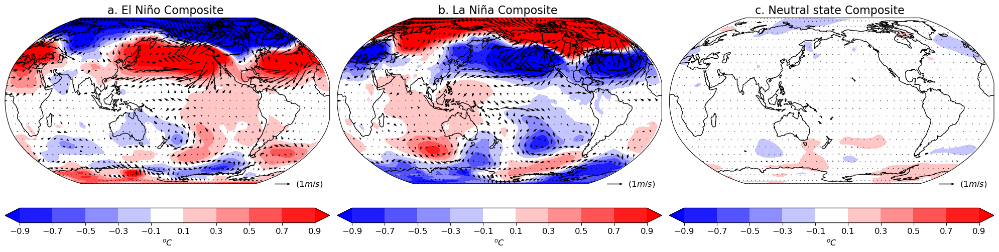

In [198]:
######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_nino_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nino_composite[0::3,0::3],VA_nino_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Composite ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_nina_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nina_composite[0::3,0::3],VA_nina_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Composite ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_neutral_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_neutral_composite[0::3,0::3],VA_neutral_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Composite ', fontsize=16)

fig.tight_layout()

#### 3. Calculamos patrón espacial (Regression Analysis)

##### Aquí asumimos que una anomalía de una variable climática x en un punto determinado puede ser explicada linealmente por un índice (en nuestro caso Niño3.4)

#### i.e., $SSTA[t,x,y]=\alpha (x,y) Nino(t)$, $UA[t,x,y]=\beta (x,y) Nino(t)$, $VA[t,x,y]=\gamma (x,y) Nino(t)$

#### Los patrones están encapsulados en $\alpha$, $\beta$ y $\gamma$, con unidades $[\alpha]=()$, $[\beta]=[\gamma]=\frac{m/s}{^{o}C}$

#### En cada punto de la grilla y para cada variable calculamos una regresión lineal en nuestro índice

In [29]:
#### Calculate regression coefficients

N_months=12*N_years

reg_SLP=np.zeros((len(lat),len(lon)))
reg_U=np.zeros((len(lat),len(lon)))
reg_V=np.zeros((len(lat),len(lon)))
   
for j in range(0,len(lon)):
    for i in range(0,len(lat)):
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=SLP[:,i,j]
        x[0,:]=SAM

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_SLP[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=UA[:,i,j]
        x[0,:]=SAM

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_U[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=VA[:,i,j]
        x[0,:]=SAM

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_V[i,j]=coeff[0][0]


    t1=time_seconds.perf_counter()
    if j%10==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')
        
reg_SLP[np.absolute(reg_SLP)>10000]=0

0.6944444444444444 %  782.7661756069999 s
7.638888888888889 %  783.4145598709999 s
14.583333333333334 %  783.7814095819999 s
21.52777777777778 %  784.104526463 s
28.47222222222222 %  784.420442657 s
35.416666666666664 %  784.7315595350001 s
42.361111111111114 %  785.0395544149999 s
49.30555555555556 %  785.3714659750001 s
56.25 %  785.7229866370001 s
63.19444444444444 %  786.26451094 s
70.13888888888889 %  786.850264254 s
77.08333333333333 %  787.1770574479999 s
84.02777777777777 %  787.495355043 s
90.97222222222223 %  787.8175160769999 s
97.91666666666667 %  788.1325981540001 s


#### Plot regression pattern

/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


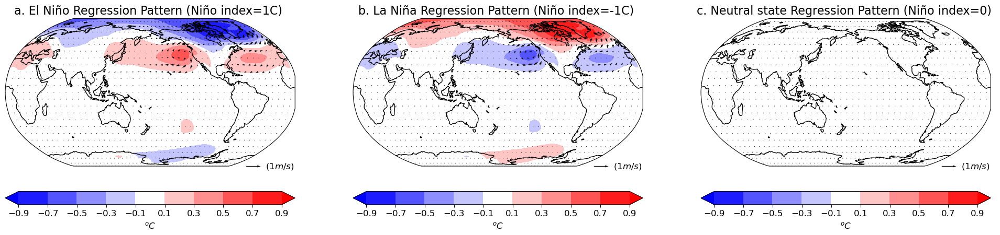

In [30]:
#### Anomalías características de un evento con índice Nino es igual a SLPA*Nino, UA*Nino, VA*Nino
#### Aquí graficaremos un patrón asociada a La Niña con Nino=-1, El Nino con Nino=1, y Neutral con Nino=0

######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_U[0::3,0::3],reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern (Niño index=1C) ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_U[0::3,0::3],-reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Regression Pattern (Niño index=-1C) ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_SLP*0.00000000000001, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 0.00000000000001*reg_U[0::3,0::3],0.00000000000001*reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Regression Pattern (Niño index=0) ', fontsize=16)

fig.tight_layout()

##### Plot them together (composite and regression)

/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbie

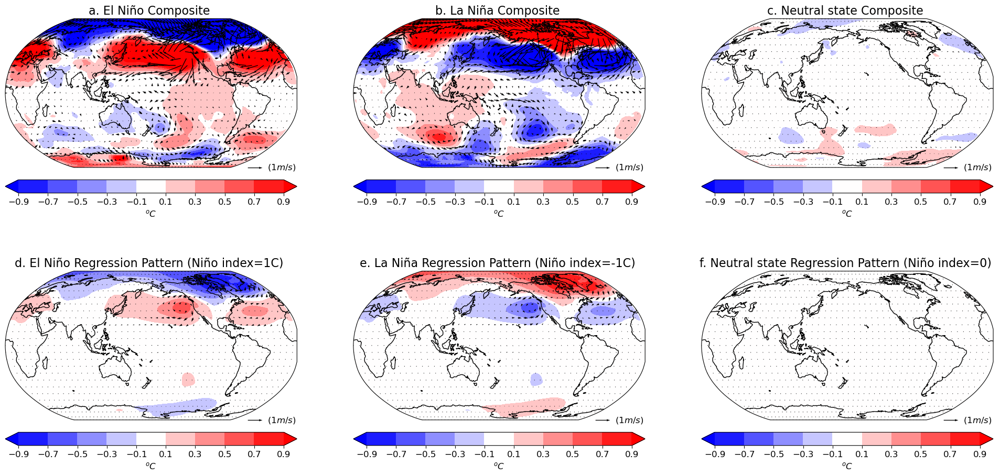

In [31]:
######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(2, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_nino_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nino_composite[0::3,0::3],VA_nino_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Composite ', fontsize=16)

####### La Niña

ax = fig.add_subplot(2, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_nina_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nina_composite[0::3,0::3],VA_nina_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Composite ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(2, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_neutral_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_neutral_composite[0::3,0::3],VA_neutral_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Composite ', fontsize=16)

#############################

ax = fig.add_subplot(2, 3, 4, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_U[0::3,0::3],reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'd. El Niño Regression Pattern (Niño index=1C) ', fontsize=16)

####### La Niña

ax = fig.add_subplot(2, 3, 5, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_U[0::3,0::3],-reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'e. La Niña Regression Pattern (Niño index=-1C) ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(2, 3, 6, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_SLP*0.00000000000001, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 0.00000000000001*reg_U[0::3,0::3],0.00000000000001*reg_V[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'f. Neutral state Regression Pattern (Niño index=0) ', fontsize=16)

fig.tight_layout()

#### Ventajas y desventajas de composite y regression analysis

##### El composite analysis puede ser usado para diagnosticar la asimetría entre los patrones de El Niño y La Niña. El regression pattern no (positivos y negativos son simétricos)

In [176]:


SLP_nino_asym=(1/2)*(SLP_nino_composite+SLP_nina_composite)
SLP_nino_sym=(1/2)*(SLP_nino_composite-SLP_nina_composite)

UA_nino_asym=(1/2)*(UA_nino_composite+UA_nina_composite)
UA_nino_sym=(1/2)*(UA_nino_composite-UA_nina_composite)

VA_nino_asym=(1/2)*(VA_nino_composite+VA_nina_composite)
VA_nino_sym=(1/2)*(VA_nino_composite-VA_nina_composite)


/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


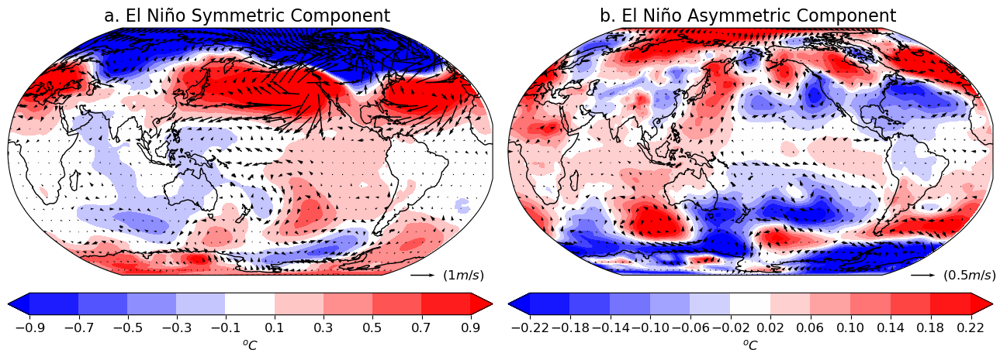

In [34]:
######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(13, 5))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, SLP_nino_sym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nino_sym[0::3,0::3],VA_nino_sym[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Symmetric Component ', fontsize=16)

########

ax = fig.add_subplot(1, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.22,0.221,0.04)
h=plt.contourf(lon, lat, SLP_nino_asym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05,ticks=[-0.22,-0.18,-0.14,-0.10,-0.06,-0.02,0.02,0.06,0.1,0.14,0.18,0.22])
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_nino_asym[0::3,0::3],VA_nino_asym[0::3,0::3],transform=crs, scale=10)
ax.quiverkey(q, X=0.88, Y=0.0, U=0.5,label=r'$(0.5m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Asymmetric Component ', fontsize=16)

fig.tight_layout()

##### Con regresión podemos tener el patrón para cualquier valor del índice. Eso no se puede hacer con el composite (si se puede variar el umbral del composite)



/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '
/Users/maxter/Downloads/CDDAmbientales/.conda/lib/python3.8/site-packages/cartopy/crs.py:529: UserWarning: Some vectors at source domain corners may not have been transformed correctly
  warnings.warn('Some vectors at source domain corners '


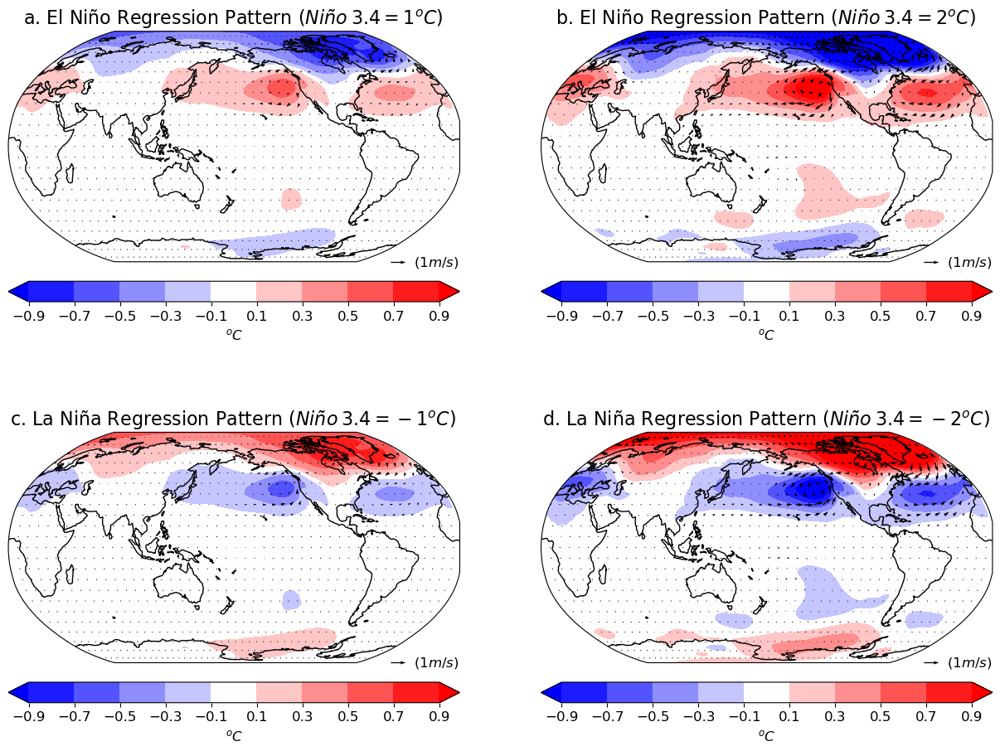

In [199]:
######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(13, 10))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_U[0::3,0::3],reg_V[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern ($Niño\:3.4=1^{o}C$) ', fontsize=16)

#########

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, 2*reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 2*reg_U[0::3,0::3],2*reg_V[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Regression Pattern ($Niño\:3.4=2^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_U[0::3,0::3],-reg_V[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. La Niña Regression Pattern ($Niño\:3.4=-1^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -2*reg_SLP, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -2*reg_U[0::3,0::3],-2*reg_V[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'd. La Niña Regression Pattern ($Niño\:3.4=-2^{o}C$) ', fontsize=16)

fig.tight_layout()

### PARTE 2

In [39]:
year_init=1965
year_fin=2014

In [40]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P2/' #### Replace with folder where file is located
filename='psl_Amon_MIROC6_historical_r1i1p1f1_gn_195001-201412.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

psl_P = ncfile.variables['psl'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: CMIP
    branch_method: standard
    branch_time_in_child: 0.0
    branch_time_in_parent: 0.0
    creation_date: 2018-11-30T16:10:06Z
    data_specs_version: 01.00.28
    experiment: all-forcing simulation of the recent past
    experiment_id: historical
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.historical.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2018-11-30T16:10:06Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National In

In [41]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P2/' #### Replace with folder where file is located
filename='uas_Amon_MIROC6_historical_r1i1p1f1_gn_195001-201412.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

uas_P = ncfile.variables['uas'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: CMIP
    branch_method: standard
    branch_time_in_child: 0.0
    branch_time_in_parent: 0.0
    creation_date: 2018-11-30T16:16:15Z
    data_specs_version: 01.00.28
    experiment: all-forcing simulation of the recent past
    experiment_id: historical
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.historical.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2018-11-30T16:16:15Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National In

In [42]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P2/' #### Replace with folder where file is located
filename='vas_Amon_MIROC6_historical_r1i1p1f1_gn_195001-201412.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

vas_P = ncfile.variables['vas'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: CMIP
    branch_method: standard
    branch_time_in_child: 0.0
    branch_time_in_parent: 0.0
    creation_date: 2018-11-30T16:17:05Z
    data_specs_version: 01.00.28
    experiment: all-forcing simulation of the recent past
    experiment_id: historical
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.historical.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2018-11-30T16:17:05Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National In

In [43]:
mean_monthly_psl_P=monthly_mean(psl_P,lat,lon)
mean_monthly_uas_P=monthly_mean(uas_P,lat,lon)
mean_monthly_vas_P=monthly_mean(vas_P,lat,lon)

0.390625 %  0.4333826349998162 s
8.203125 %  5.21481602699987 s
16.015625 %  9.379012877999685 s
23.828125 %  13.363969644999997 s
31.640625 %  17.416640383999948 s
39.453125 %  21.49627529999998 s
47.265625 %  25.441011923999667 s
55.078125 %  29.47547262099988 s
62.890625 %  33.43209129999968 s
70.703125 %  37.65043427499995 s
78.515625 %  41.96744703599961 s
86.328125 %  46.22380704599982 s
94.140625 %  50.287798634999945 s
0.390625 %  0.23754314200004956 s
8.203125 %  4.81150685800003 s
16.015625 %  8.778047713999968 s
23.828125 %  12.81499426900018 s
31.640625 %  16.79686562699999 s
39.453125 %  20.86089915299999 s
47.265625 %  24.814791961000083 s
55.078125 %  28.86809574200015 s
62.890625 %  32.81173713699991 s
70.703125 %  36.870144410000194 s
78.515625 %  41.59014410300006 s
86.328125 %  47.023568306000016 s
94.140625 %  51.11154516600027 s
0.390625 %  0.25003336300005685 s
8.203125 %  5.311135305999869 s
16.015625 %  10.326655028999994 s
23.828125 %  14.715408623000258 s
31.6

In [44]:
##3## Hacemos un fit al ciclo estacional removiendo los dos primeros harmònicos de Fourier
mean_monthly_psl_P_fit_tem=np.zeros(mean_monthly_psl_P.shape)
mean_monthly_uas_P_fit_tem=np.zeros(mean_monthly_uas_P.shape)
mean_monthly_vas_P_fit_tem=np.zeros(mean_monthly_vas_P.shape)

t0=time_seconds.perf_counter()
for j in range(0,len(lon)): 
    for i in range(0,len(lat)):
        mean_monthly_psl_P_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_psl_P[:,i,j])
        mean_monthly_uas_P_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_uas_P[:,i,j])
        mean_monthly_vas_P_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_vas_P[:,i,j])
    t1=time_seconds.perf_counter()
    if j%20==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')

0.390625 %  0.09726333099979456 s
8.203125 %  1.7602082329999575 s
16.015625 %  2.7541430269998273 s
23.828125 %  3.8438731040000675 s
31.640625 %  5.131060150999929 s
39.453125 %  6.752014246999806 s
47.265625 %  7.750801269000021 s
55.078125 %  8.826505370999712 s
62.890625 %  10.079698801999712 s
70.703125 %  11.264819773999989 s
78.515625 %  12.443677268000101 s
86.328125 %  13.918915290999848 s
94.140625 %  15.52514578399996 s


In [45]:
#### Make N_years copies (N_years= repleace with number of years of the dataset. For monthly data this is len(timeseries[:,0,0])/12)
N_years=int(year_fin-year_init+1)
mean_monthly_psl_P_fit=np.zeros(psl_P.shape)
mean_monthly_uas_P_fit=np.zeros(uas_P.shape)
mean_monthly_vas_P_fit=np.zeros(vas_P.shape)

for i in range(0,N_years):
    mean_monthly_psl_P_fit[12*i:12*(i+1),:,:]=mean_monthly_psl_P_fit_tem
    mean_monthly_uas_P_fit[12*i:12*(i+1),:,:]=mean_monthly_uas_P_fit_tem
    mean_monthly_vas_P_fit[12*i:12*(i+1),:,:]=mean_monthly_vas_P_fit_tem

Text(0.5, 1.0, 'Ciclo estacional meridional wind')

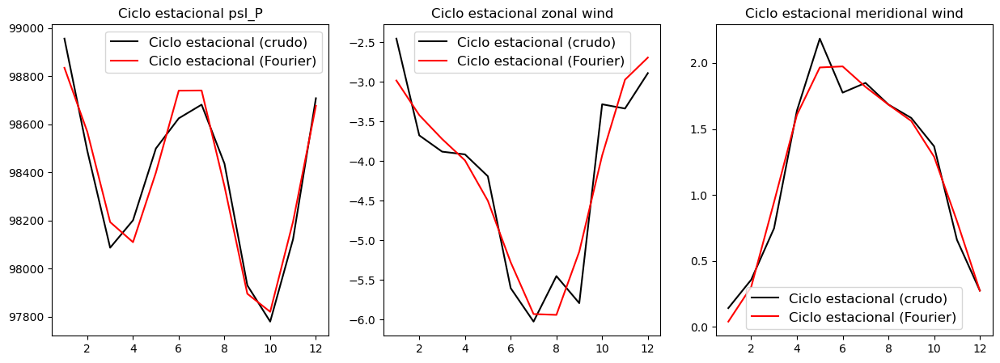

In [46]:
i=15
j=20

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1,3,1)
ax.plot(np.arange(1,12.1),mean_monthly_psl_P[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_psl_P_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional psl_P')

ax = fig.add_subplot(1,3,2)
ax.plot(np.arange(1,12.1),mean_monthly_uas_P[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_uas_P_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional zonal wind')

ax = fig.add_subplot(1,3,3)
ax.plot(np.arange(1,12.1),mean_monthly_vas_P[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_vas_P_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional meridional wind')

In [75]:
PSL_PA=psl_P-mean_monthly_psl_P_fit
UA_P=uas_P-mean_monthly_uas_P_fit
VA_P=vas_P-mean_monthly_vas_P_fit

In [49]:
lat_lo=30; lat_hi = 40; lon_lo = 220; lon_hi = 250;  ####Niño 3.4 region https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

PSL_PA_ni=PSL_PA[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_PN=np.mean(np.mean(PSL_PA_ni,axis=2),axis=1)

np.std(SAM_PN)

228.12221273848638

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_PN index')

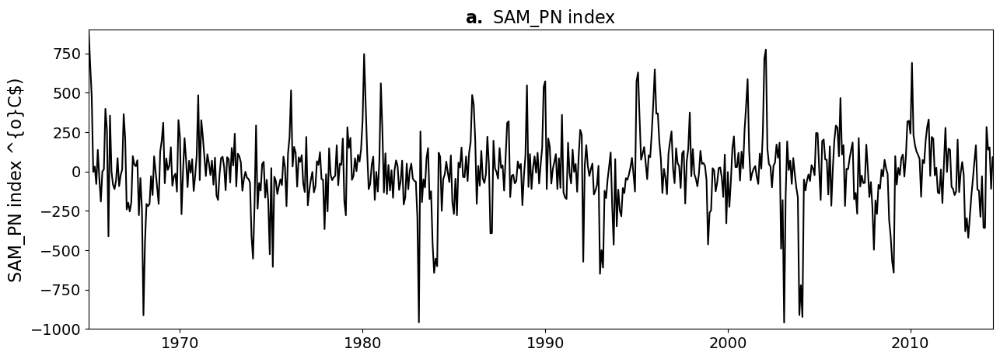

In [58]:
fontsize=16

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_PN, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM_PN index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-1000,900)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_PN index' , fontsize=16)

In [59]:
lat_lo=60; lat_hi = 70; lon_lo = 250; lon_hi = 280;  ####Niño 3.4 region https://climatedataguide.ucar.edu/climate-data/nino-sst-indices-nino-12-3-34-4-oni-and-tni

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

PSL_PA_ni=PSL_PA[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_PS=np.mean(np.mean(PSL_PA_ni,axis=2),axis=1)

np.std(SAM_PS)

321.20392233137636

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_PS index')

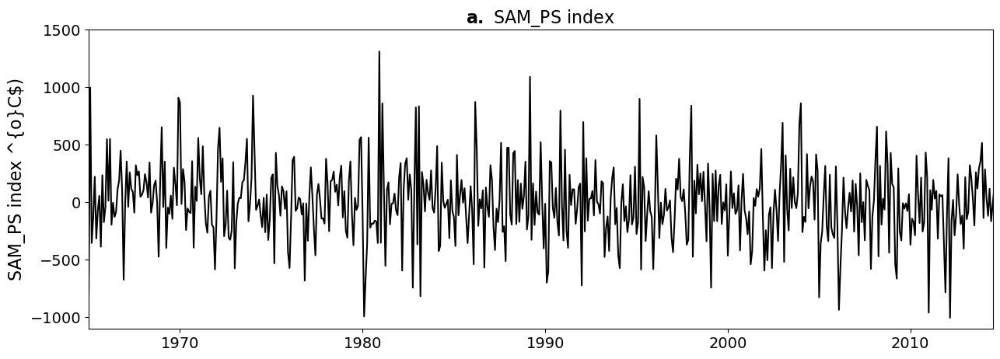

In [67]:
fontsize=16

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_PS, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM_PS index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-1100,1500)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_PS index' , fontsize=16)

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_P Sea Level Pressure (1965 - 2014)')

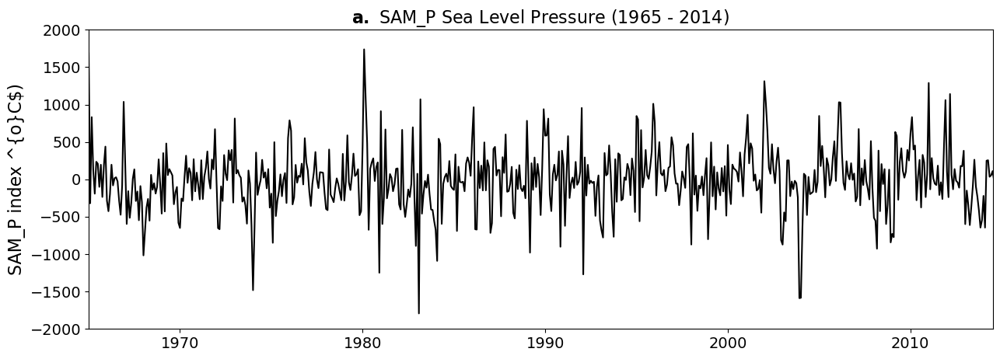

In [74]:
SAM_P = SAM_PN - SAM_PS

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_P, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM_P index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-2000,2000)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_P Sea Level Pressure (1965 - 2014)' , fontsize=16)

#### Composite 

In [80]:
desv_P = np.std(SAM_P)*0.8

In [82]:
I_nino_P=np.argwhere(SAM_P>=desv_P)
I_nina_P=np.argwhere(SAM_P<=-desv_P)
I_neutral_P=np.argwhere((SAM_P>-desv_P) & (SAM_P<desv_P))

PSL_PA_nino=np.squeeze(PSL_PA[I_nino_P,:,:]) #### Seleccionamos sólo los meses con SAM>desv_P (note: np.squeeze removes singleton dimension)
UA_P_nino=np.squeeze(UA_P[I_nino_P,:,:]) #### Seleccionamos sólo los meses con SAM>desv_P (note: np.squeeze removes singleton dimension)
VA_P_nino=np.squeeze(VA_P[I_nino_P,:,:]) #### Seleccionamos sólo los meses con SAM>desv_P (note: np.squeeze removes singleton dimension)

PSL_PA_nina=np.squeeze(PSL_PA[I_nina_P,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_P (note: np.squeeze removes singleton dimension)
UA_P_nina=np.squeeze(UA_P[I_nina_P,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_P (note: np.squeeze removes singleton dimension)
VA_P_nina=np.squeeze(VA_P[I_nina_P,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_P (note: np.squeeze removes singleton dimension)

PSL_PA_neutral=np.squeeze(PSL_PA[I_neutral_P,:,:]) #### Seleccionamos sólo los meses con SAM<desv_P y SAM>-desv_P (note: np.squeeze removes singleton dimension)
UA_P_neutral=np.squeeze(UA_P[I_neutral_P,:,:]) #### Seleccionamos sólo los meses con SAM<desv_P y SAM>-desv_P (note: np.squeeze removes singleton dimension)
VA_P_neutral=np.squeeze(VA_P[I_neutral_P,:,:]) #### Seleccionamos sólo los meses con SAM<desv_P y SAM>-desv_P (note: np.squeeze removes singleton dimension)

In [83]:
PSL_PA_nino_composite=np.mean(PSL_PA_nino,axis=0)
PSL_PA_nina_composite=np.mean(PSL_PA_nina,axis=0)
PSL_PA_neutral_composite=np.mean(PSL_PA_neutral,axis=0)

UA_P_nino_composite=np.mean(UA_P_nino,axis=0)
UA_P_nina_composite=np.mean(UA_P_nina,axis=0)
UA_P_neutral_composite=np.mean(UA_P_neutral,axis=0)

VA_P_nino_composite=np.mean(VA_P_nino,axis=0)
VA_P_nina_composite=np.mean(VA_P_nina,axis=0)
VA_P_neutral_composite=np.mean(VA_P_neutral,axis=0)

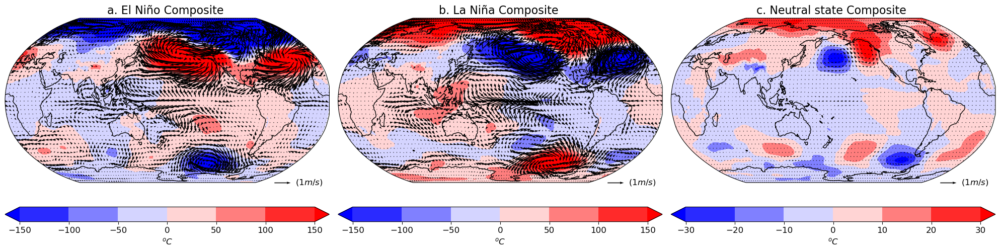

In [155]:
######Start with Nino4,Nino3,Nino1+2

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_PA_nino_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nino_composite[0::3,0::3],VA_P_nino_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Composite ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_PA_nina_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nina_composite[0::3,0::3],VA_P_nina_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Composite ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-30,31,10)
h=plt.contourf(lon, lat, PSL_PA_neutral_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_neutral_composite[0::3,0::3],VA_P_neutral_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Composite ', fontsize=16)

fig.tight_layout()

#### Regression

In [87]:
N_months=12*N_years

reg_PSL_P=np.zeros((len(lat),len(lon)))
reg_UP=np.zeros((len(lat),len(lon)))
reg_VP=np.zeros((len(lat),len(lon)))
   
for j in range(0,len(lon)):
    for i in range(0,len(lat)):
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=PSL_PA[:,i,j]
        x[0,:]=SAM_P

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_PSL_P[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=UA_P[:,i,j]
        x[0,:]=SAM_P

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_UP[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=VA_P[:,i,j]
        x[0,:]=SAM_P

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_VP[i,j]=coeff[0][0]


    t1=time_seconds.perf_counter()
    if j%10==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')
        
reg_PSL_P[np.absolute(reg_PSL_P)>10000]=0

0.390625 %  3684.892328185 s
4.296875 %  3686.0056580949995 s
8.203125 %  3687.0451595980003 s
12.109375 %  3687.553441264 s
16.015625 %  3688.117170961 s
19.921875 %  3688.642965145 s
23.828125 %  3689.239253727 s
27.734375 %  3690.2936559729997 s
31.640625 %  3691.331742263 s
35.546875 %  3691.892941471 s
39.453125 %  3692.4199895659995 s
43.359375 %  3692.967555972 s
47.265625 %  3693.459811027 s
51.171875 %  3693.9563263459995 s
55.078125 %  3694.467905474 s
58.984375 %  3695.081632941 s
62.890625 %  3695.61910361 s
66.796875 %  3696.416817861 s
70.703125 %  3696.926376257 s
74.609375 %  3697.419442962 s
78.515625 %  3697.933780319 s
82.421875 %  3698.434725352 s
86.328125 %  3698.932477061 s
90.234375 %  3699.4393569989998 s
94.140625 %  3699.9726957069997 s
98.046875 %  3700.4805086819997 s


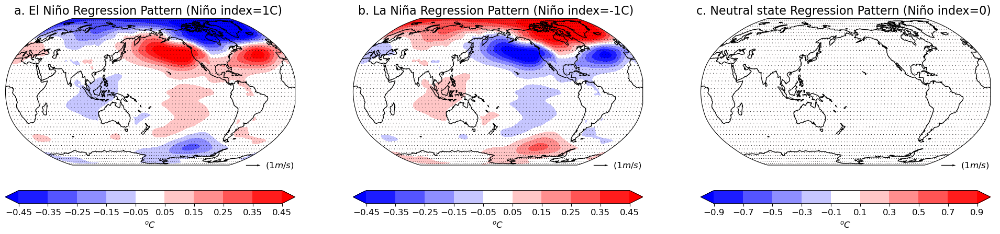

In [163]:
fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.45,0.46,0.1)
h=plt.contourf(lon, lat, reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_UP[0::3,0::3],reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern (Niño index=1C) ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.45,0.46,0.1)
h=plt.contourf(lon, lat, -reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_UP[0::3,0::3],-reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Regression Pattern (Niño index=-1C) ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_P*0.00000000000001, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 0.00000000000001*reg_UP[0::3,0::3],0.00000000000001*reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Regression Pattern (Niño index=0) ', fontsize=16)

fig.tight_layout()

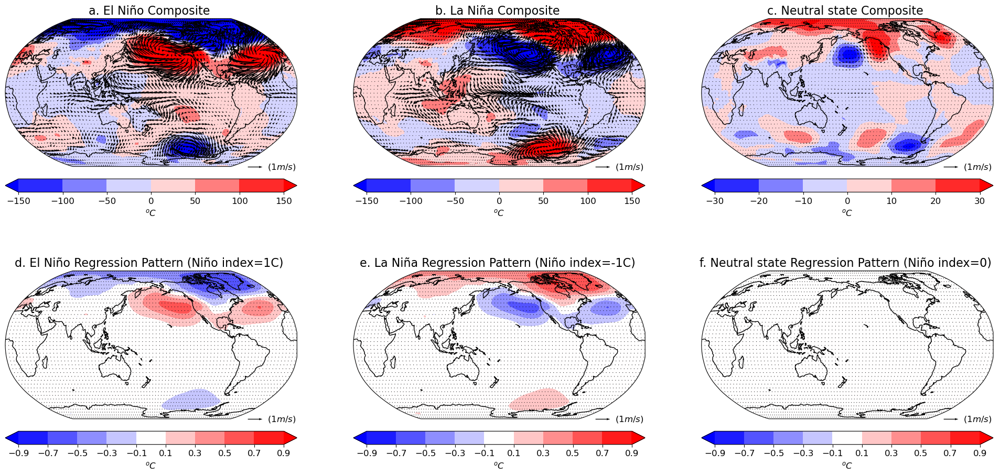

In [156]:
fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)
fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(2, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_PA_nino_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nino_composite[0::3,0::3],VA_P_nino_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Composite ', fontsize=16)

####### La Niña

ax = fig.add_subplot(2, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_PA_nina_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nina_composite[0::3,0::3],VA_P_nina_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Composite ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(2, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-30,31,10)
h=plt.contourf(lon, lat, PSL_PA_neutral_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_neutral_composite[0::3,0::3],VA_P_neutral_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Composite ', fontsize=16)

#############################

ax = fig.add_subplot(2, 3, 4, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_UP[0::3,0::3],reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'd. El Niño Regression Pattern (Niño index=1C) ', fontsize=16)

####### La Niña

ax = fig.add_subplot(2, 3, 5, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_UP[0::3,0::3],-reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'e. La Niña Regression Pattern (Niño index=-1C) ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(2, 3, 6, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_P*0.00000000000001, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 0.00000000000001*reg_UP[0::3,0::3],0.00000000000001*reg_VP[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'f. Neutral state Regression Pattern (Niño index=0) ', fontsize=16)

fig.tight_layout()

In [92]:
PSL_PA_nino_asym=(1/2)*(PSL_PA_nino_composite+PSL_PA_nina_composite)
PSL_PA_nino_sym=(1/2)*(PSL_PA_nino_composite-PSL_PA_nina_composite)

UA_P_nino_asym=(1/2)*(UA_P_nino_composite+UA_P_nina_composite)
UA_P_nino_sym=(1/2)*(UA_P_nino_composite-UA_P_nina_composite)

VA_P_nino_asym=(1/2)*(VA_P_nino_composite+VA_P_nina_composite)
VA_P_nino_sym=(1/2)*(VA_P_nino_composite-VA_P_nina_composite)

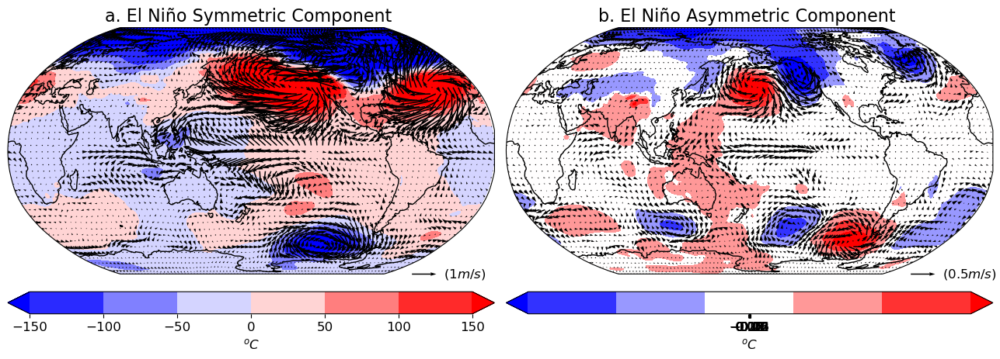

In [169]:
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(13, 5))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_PA_nino_sym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nino_sym[0::3,0::3],VA_P_nino_sym[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Symmetric Component ', fontsize=16)

########

ax = fig.add_subplot(1, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-50,51,20)
h=plt.contourf(lon, lat, PSL_PA_nino_asym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05,ticks=[-0.22,-0.18,-0.14,-0.10,-0.06,-0.02,0.02,0.06,0.1,0.14,0.18,0.22])
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_P_nino_asym[0::3,0::3],VA_P_nino_asym[0::3,0::3],transform=crs, scale=10)
ax.quiverkey(q, X=0.88, Y=0.0, U=0.5,label=r'$(0.5m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Asymmetric Component ', fontsize=16)

fig.tight_layout()

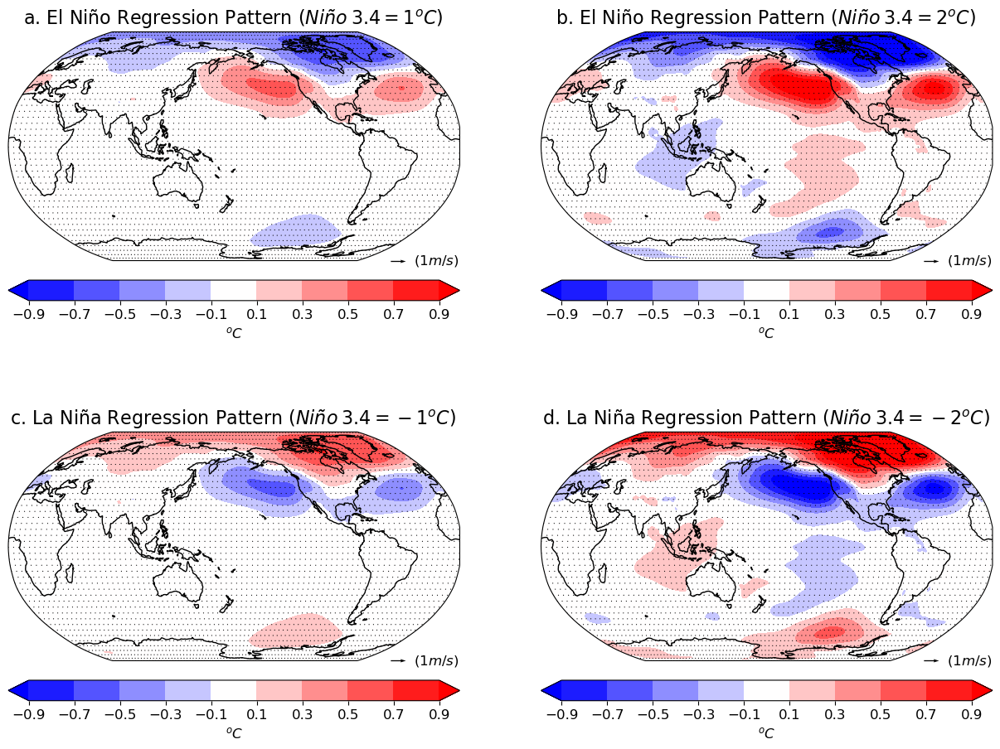

In [173]:
fig = plt.figure(figsize=(13, 10))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_UP[0::3,0::3],reg_VP[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern ($Niño\:3.4=1^{o}C$) ', fontsize=16)

#########

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, 2*reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 2*reg_UP[0::3,0::3],2*reg_VP[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Regression Pattern ($Niño\:3.4=2^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_UP[0::3,0::3],-reg_VP[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. La Niña Regression Pattern ($Niño\:3.4=-1^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -2*reg_PSL_P, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -2*reg_UP[0::3,0::3],-2*reg_VP[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'd. La Niña Regression Pattern ($Niño\:3.4=-2^{o}C$) ', fontsize=16)

fig.tight_layout()

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_P Sea Level Pressure (1965 - 2014)')

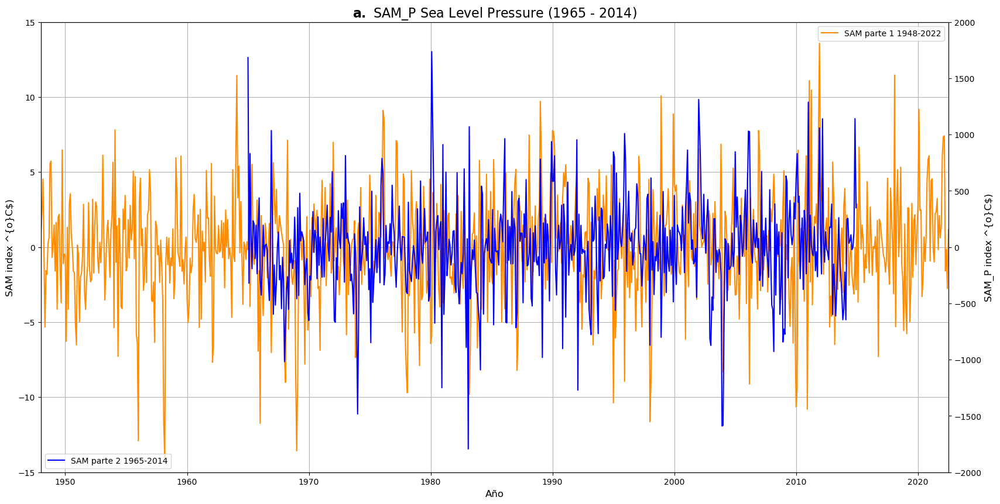

In [105]:
fig = plt.figure(figsize=(20,10))
fontsize=12

bins=np.arange(-5,5.01,0.2)

ax1 = fig.add_subplot(1,1,1)
ax1.plot(np.arange(1948,2022+1,1/12),SAM, 'k-',linewidth=1.5,label='SAM parte 1 1948-2022',color="darkorange") 
ax2 = ax1.twinx()
ax2.plot(np.arange(1965,2014+1,1/12),SAM_P, 'k-',linewidth=1.5,label='SAM parte 2 1965-2014',color="blue") 
ax1.tick_params(labelsize=fontsize-2)
ax1.set_xlabel('Año', fontsize=fontsize)
ax1.set_ylabel(r'SAM index ^{o}C$)', fontsize=fontsize)
ax2.set_ylabel(r'SAM_P index ^{o}C$)', fontsize=fontsize)
ax1.legend(loc=0)
ax2.legend(loc=3)
ax1.grid()
ax2.set_ylim(-2000,2000)
ax1.set_ylim(-15,15)
ax1.set_xlim(1948,2022+1/2)
ax2.set_title(r'$\mathbf{a.}$ SAM_P Sea Level Pressure (1965 - 2014)' , fontsize=16)

### PARTE 3

In [96]:
year_init=2050
year_fin=2099

In [106]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P3/' #### Replace with folder where file is located
filename='psl_Amon_MIROC6_ssp245_r1i1p1f1_gn_201501-210012.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

psl_F = ncfile.variables['psl'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: ScenarioMIP
    branch_method: standard
    branch_time_in_child: 60265.0
    branch_time_in_parent: 60265.0
    creation_date: 2019-06-14T02:36:21Z
    data_specs_version: 01.00.29
    experiment: update of RCP4.5 based on SSP2
    experiment_id: ssp245
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.ssp245.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2019-06-14T02:36:21Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National Instit

In [107]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P3/' #### Replace with folder where file is located
filename='uas_Amon_MIROC6_ssp245_r1i1p1f1_gn_201501-210012.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

uas_F = ncfile.variables['uas'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: ScenarioMIP
    branch_method: standard
    branch_time_in_child: 60265.0
    branch_time_in_parent: 60265.0
    creation_date: 2019-06-14T02:41:27Z
    data_specs_version: 01.00.29
    experiment: update of RCP4.5 based on SSP2
    experiment_id: ssp245
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.ssp245.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2019-06-14T02:41:27Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National Instit

In [108]:
t0=time_seconds.perf_counter()

hist_start=datetime.datetime(year_init,1,1)  ####SSH only covers these years. Precip starts in 1979
hist_end=datetime.datetime(year_fin,12,31)

file_root='Arch_P3/' #### Replace with folder where file is located
filename='vas_Amon_MIROC6_ssp245_r1i1p1f1_gn_201501-210012.nc' #### replace with name of the file

ncfile = netCDF4.Dataset(file_root + filename, 'r', format='NETCDF4')
print(ncfile)
time = ncfile.variables['time']
time_converted = netCDF4.num2date(time[:], time.units)#, time.calendar) ###year, month, day
time_indices = np.array([(t.month in months)&(t.year in range(hist_start.year, hist_end.year+1)) for t in time_converted])

lat = ncfile.variables['lat'][:]
lon = ncfile.variables['lon'][:]

# ######## have lon go between 0 and 360

vas_F = ncfile.variables['vas'][time_indices,:,:]

t1=time_seconds.perf_counter()

print(t1-t0,'s')

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4_CLASSIC data model, file format HDF5):
    Conventions: CF-1.7 CMIP-6.2
    activity_id: ScenarioMIP
    branch_method: standard
    branch_time_in_child: 60265.0
    branch_time_in_parent: 60265.0
    creation_date: 2019-06-14T02:41:44Z
    data_specs_version: 01.00.29
    experiment: update of RCP4.5 based on SSP2
    experiment_id: ssp245
    external_variables: areacella
    forcing_index: 1
    frequency: mon
    further_info_url: https://furtherinfo.es-doc.org/CMIP6.MIROC.MIROC6.ssp245.none.r1i1p1f1
    grid: native atmosphere T85 Gaussian grid
    grid_label: gn
    history: 2019-06-14T02:41:44Z ; CMOR rewrote data to be consistent with CMIP6, CF-1.7 CMIP-6.2 and CF standards.
    initialization_index: 1
    institution: JAMSTEC (Japan Agency for Marine-Earth Science and Technology, Kanagawa 236-0001, Japan), AORI (Atmosphere and Ocean Research Institute, The University of Tokyo, Chiba 277-8564, Japan), NIES (National Instit

In [109]:
mean_monthly_psl_F=monthly_mean(psl_F,lat,lon)
mean_monthly_uas_F=monthly_mean(uas_F,lat,lon)
mean_monthly_vas_F=monthly_mean(vas_F,lat,lon)

0.390625 %  0.3814924010002869 s
8.203125 %  5.041470910999124 s
16.015625 %  9.123572389000401 s
23.828125 %  13.308584078999047 s
31.640625 %  17.416380509999726 s
39.453125 %  21.49844638399918 s
47.265625 %  25.539044052000463 s
55.078125 %  29.812600016999568 s
62.890625 %  33.900320614999146 s
70.703125 %  37.90313204700033 s
78.515625 %  42.018844710999474 s
86.328125 %  46.128462036998826 s
94.140625 %  50.30763174899948 s
0.390625 %  0.19750113299960503 s
8.203125 %  4.337447939000413 s
16.015625 %  8.777214711000852 s
23.828125 %  13.316935246000867 s
31.640625 %  17.661664021999968 s
39.453125 %  21.83739179999975 s
47.265625 %  25.857634963000237 s
55.078125 %  30.46285569199972 s
62.890625 %  36.875494402000186 s
70.703125 %  43.59639497900025 s
78.515625 %  47.75814641999932 s
86.328125 %  51.903298477000135 s
94.140625 %  55.92990723799994 s
0.390625 %  0.28591690399844083 s
8.203125 %  4.383443465998425 s
16.015625 %  8.438985175998823 s
23.828125 %  12.486493743999745 

In [110]:
mean_monthly_psl_F_fit_tem=np.zeros(mean_monthly_psl_F.shape)
mean_monthly_uas_F_fit_tem=np.zeros(mean_monthly_uas_F.shape)
mean_monthly_vas_F_fit_tem=np.zeros(mean_monthly_vas_F.shape)

t0=time_seconds.perf_counter()
for j in range(0,len(lon)): 
    for i in range(0,len(lat)):
        mean_monthly_psl_F_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_psl_F[:,i,j])
        mean_monthly_uas_F_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_uas_F[:,i,j])
        mean_monthly_vas_F_fit_tem[:,i,j]=seas_cycle_fit(mean_monthly_vas_F[:,i,j])
    t1=time_seconds.perf_counter()
    if j%20==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')

0.390625 %  0.09811712700138742 s
8.203125 %  2.208984777000296 s
16.015625 %  3.590681723000671 s
23.828125 %  4.965070378000746 s
31.640625 %  6.219991321000634 s
39.453125 %  7.56084730800103 s
47.265625 %  8.551047769000434 s
55.078125 %  9.548326361000363 s
62.890625 %  10.54725912899994 s
70.703125 %  11.542033696001454 s
78.515625 %  12.539059067999915 s
86.328125 %  13.559279242999764 s
94.140625 %  16.257297615000425 s


In [111]:
N_years=int(year_fin-year_init+1)
mean_monthly_psl_F_fit=np.zeros(psl_F.shape)
mean_monthly_uas_F_fit=np.zeros(uas_F.shape)
mean_monthly_vas_F_fit=np.zeros(vas_F.shape)

for i in range(0,N_years):
    mean_monthly_psl_F_fit[12*i:12*(i+1),:,:]=mean_monthly_psl_F_fit_tem
    mean_monthly_uas_F_fit[12*i:12*(i+1),:,:]=mean_monthly_uas_F_fit_tem
    mean_monthly_vas_F_fit[12*i:12*(i+1),:,:]=mean_monthly_vas_F_fit_tem

Text(0.5, 1.0, 'Ciclo estacional meridional wind')

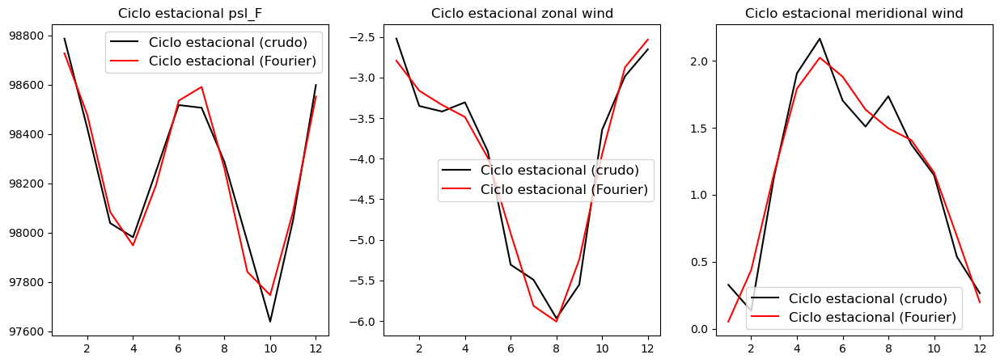

In [112]:
i=15
j=20

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1,3,1)
ax.plot(np.arange(1,12.1),mean_monthly_psl_F[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_psl_F_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional psl_F')

ax = fig.add_subplot(1,3,2)
ax.plot(np.arange(1,12.1),mean_monthly_uas_F[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_uas_F_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional zonal wind')

ax = fig.add_subplot(1,3,3)
ax.plot(np.arange(1,12.1),mean_monthly_vas_F[:,i,j],'-k',label='Ciclo estacional (crudo)')
ax.plot(np.arange(1,12.1),mean_monthly_vas_F_fit_tem[:,i,j],'-r',label='Ciclo estacional (Fourier)')
ax.legend(loc='best',fontsize=12)
ax.set_title('Ciclo estacional meridional wind')

In [113]:
PSL_FA=psl_F-mean_monthly_psl_F_fit
UA_F=uas_F-mean_monthly_uas_F_fit
VA_F=vas_F-mean_monthly_vas_F_fit

In [121]:
lat_lo=30; lat_hi = 40; lon_lo = 220; lon_hi = 250;

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

PSL_FA_ni=PSL_FA[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_FN=np.mean(np.mean(PSL_FA_ni,axis=2),axis=1)

np.std(SAM_FN)

216.25324668180681

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_FN index')

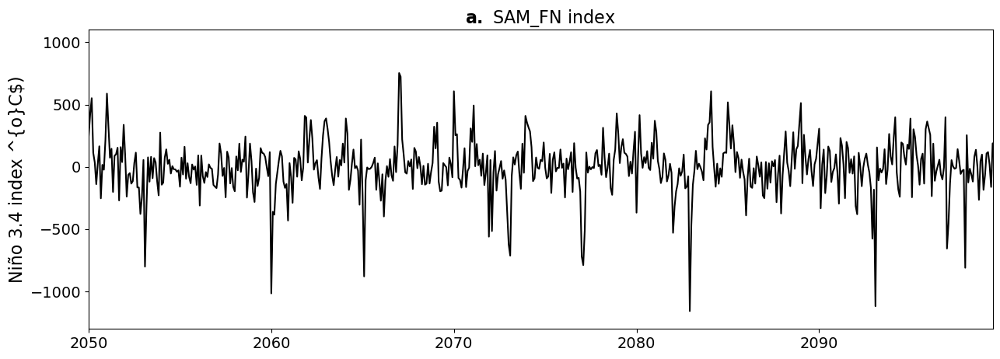

In [123]:
fontsize=16

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_FN, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'Niño 3.4 index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-1300,1100)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_FN index' , fontsize=16)

In [124]:
lat_lo=60; lat_hi = 70; lon_lo = 250; lon_hi = 280; 

model_lon_indices = (lon>=lon_lo) & (lon<=lon_hi)
model_lat_indices = (lat>=lat_lo) & (lat<=lat_hi)

##### Apply indices

PSL_FA_ni=PSL_FA[:,model_lat_indices,:][:,:,model_lon_indices]

SAM_FS=np.mean(np.mean(PSL_FA_ni,axis=2),axis=1)

np.std(SAM_FS)

302.6101588461837

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_FS index')

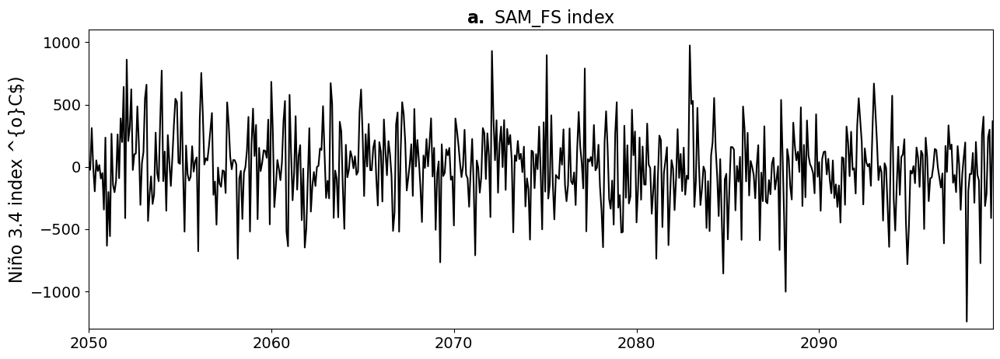

In [125]:
fontsize=16

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_FS, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'Niño 3.4 index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-1300,1100)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_FS index' , fontsize=16)

Text(0.5, 1.0, '$\\mathbf{a.}$ SAM_F Sea Level Pressure (1965 - 2014)')

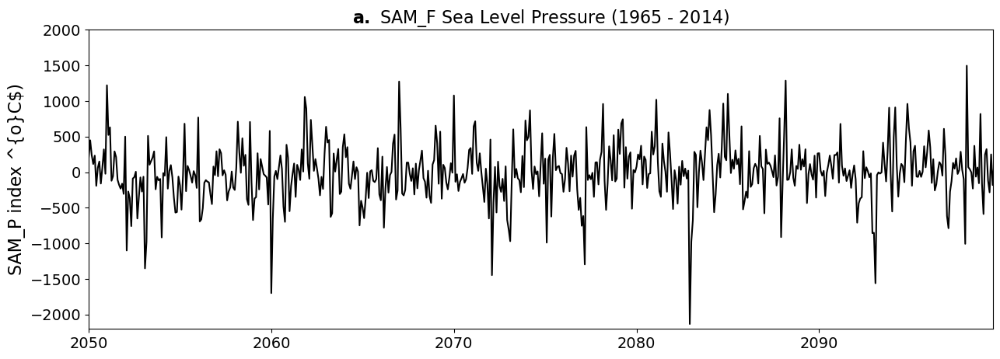

In [128]:
SAM_F = SAM_FN - SAM_FS

fig = plt.figure(figsize=(15,5))  ###figsize width height in inches https://matplotlib.org/3.1.0/api/_as_gen/matplotlib.pyplot.figure.html

#########
ax4 = fig.add_subplot(1,1,1)
# ax4.plot(np.arange(1,12.1),monthly_acc_pr3m, 'ko-',linewidth=1.5)
ax4.plot(np.arange(year_init,year_fin+1,1/12),SAM_F, 'k-',linewidth=1.5) 
# ax4.legend(loc='best',fontsize=14)
# ax4.set_xlabel('', fontsize=fontsize)
ax4.tick_params(labelsize=fontsize-2)
ax4.set_ylabel(r'SAM_P index ^{o}C$)', fontsize=fontsize)
ax4.set_ylim(-2200,2000)
ax4.set_xlim(year_init,year_fin+1/2)
ax4.set_title(r'$\mathbf{a.}$ SAM_F Sea Level Pressure (1965 - 2014)' , fontsize=16)

#### Composite

In [138]:
desv_F = np.std(SAM_F)*0.8
print(desv_F)

323.62461585583173


In [130]:
I_nino_F=np.argwhere(SAM_F>=desv_F)
I_nina_F=np.argwhere(SAM_F<=-desv_F)
I_neutral_F=np.argwhere((SAM_F>-desv_F) & (SAM_F<desv_F))

PSL_FA_nino=np.squeeze(PSL_FA[I_nino_F,:,:]) #### Seleccionamos sólo los meses con SAM>desv_F (note: np.squeeze removes singleton dimension)
UA_F_nino=np.squeeze(UA_F[I_nino_F,:,:]) #### Seleccionamos sólo los meses con SAM>desv_F (note: np.squeeze removes singleton dimension)
VA_F_nino=np.squeeze(VA_F[I_nino_F,:,:]) #### Seleccionamos sólo los meses con SAM>desv_F (note: np.squeeze removes singleton dimension)

PSL_FA_nina=np.squeeze(PSL_FA[I_nina_F,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_F (note: np.squeeze removes singleton dimension)
UA_F_nina=np.squeeze(UA_F[I_nina_F,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_F (note: np.squeeze removes singleton dimension)
VA_F_nina=np.squeeze(VA_F[I_nina_F,:,:]) #### Seleccionamos sólo los meses con SAM>-desv_F (note: np.squeeze removes singleton dimension)

PSL_FA_neutral=np.squeeze(PSL_FA[I_neutral_F,:,:]) #### Seleccionamos sólo los meses con SAM<desv_F y SAM>-desv_F (note: np.squeeze removes singleton dimension)
UA_F_neutral=np.squeeze(UA_F[I_neutral_F,:,:]) #### Seleccionamos sólo los meses con SAM<desv_F y SAM>-desv_F (note: np.squeeze removes singleton dimension)
VA_F_neutral=np.squeeze(VA_F[I_neutral_F,:,:]) #### Seleccionamos sólo los meses con SAM<desv_F y SAM>-desv_F (note: np.squeeze removes singleton dimension)

In [131]:
PSL_FA_nino_composite=np.mean(PSL_FA_nino,axis=0)
PSL_FA_nina_composite=np.mean(PSL_FA_nina,axis=0)
PSL_FA_neutral_composite=np.mean(PSL_FA_neutral,axis=0)

UA_F_nino_composite=np.mean(UA_F_nino,axis=0)
UA_F_nina_composite=np.mean(UA_F_nina,axis=0)
UA_F_neutral_composite=np.mean(UA_F_neutral,axis=0)

VA_F_nino_composite=np.mean(VA_F_nino,axis=0)
VA_F_nina_composite=np.mean(VA_F_nina,axis=0)
VA_F_neutral_composite=np.mean(VA_F_neutral,axis=0)

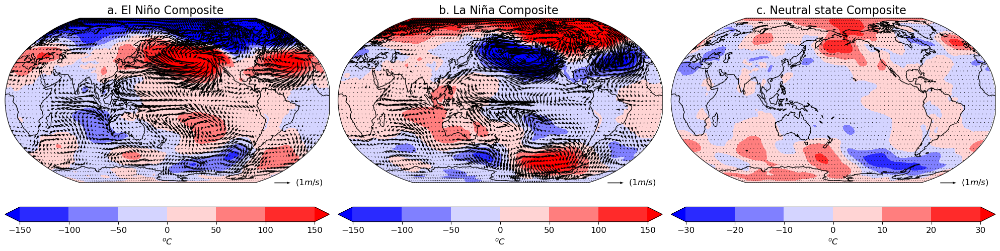

In [157]:
fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_FA_nino_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_F_nino_composite[0::3,0::3],VA_F_nino_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Composite ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_FA_nina_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_F_nina_composite[0::3,0::3],VA_F_nina_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Composite ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-30,31,10)
h=plt.contourf(lon, lat, PSL_FA_neutral_composite, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_F_neutral_composite[0::3,0::3],VA_F_neutral_composite[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Composite ', fontsize=16)

fig.tight_layout()

#### Regression

In [159]:
N_months=12*N_years

reg_PSL_F=np.zeros((len(lat),len(lon)))
reg_UF=np.zeros((len(lat),len(lon)))
reg_VF=np.zeros((len(lat),len(lon)))
   
for j in range(0,len(lon)):
    for i in range(0,len(lat)):
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=PSL_FA[:,i,j]
        x[0,:]=SAM_F

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_PSL_F[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=UA_F[:,i,j]
        x[0,:]=SAM_F

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_UF[i,j]=coeff[0][0]
        
        ############
        y=np.zeros([1,N_months]) #1xlength(bin)
        x=np.zeros([1,N_months])  ##Predictors 3xbin

        y[0,:]=VA_F[:,i,j]
        x[0,:]=SAM_F

        coeff=y.dot(np.linalg.pinv(x))

        y_rec=coeff[0][0]*x
        
        reg_VF[i,j]=coeff[0][0]


    t1=time_seconds.perf_counter()
    if j%10==0:
        print(100*(j+1)/len(lon),'% ',t1-t0,'s')
        
reg_PSL_F[np.absolute(reg_PSL_F)>10000]=0

0.390625 %  4504.974814933001 s
4.296875 %  4505.540123298 s
8.203125 %  4506.026606281001 s
12.109375 %  4506.509483055001 s
16.015625 %  4506.991706713001 s
19.921875 %  4507.4771064510005 s
23.828125 %  4508.267502752 s
27.734375 %  4508.8693940230005 s
31.640625 %  4509.359944103 s
35.546875 %  4509.845838364001 s
39.453125 %  4510.45848094 s
43.359375 %  4510.944534456001 s
47.265625 %  4511.494209948001 s
51.171875 %  4511.974728082001 s
55.078125 %  4512.458449908001 s
58.984375 %  4512.944431532 s
62.890625 %  4513.432190571 s
66.796875 %  4513.915841040001 s
70.703125 %  4514.399239181001 s
74.609375 %  4514.8852719080005 s
78.515625 %  4515.373887023001 s
82.421875 %  4515.857285238 s
86.328125 %  4516.347381520001 s
90.234375 %  4516.837333659001 s
94.140625 %  4517.330860583001 s
98.046875 %  4517.818389962 s


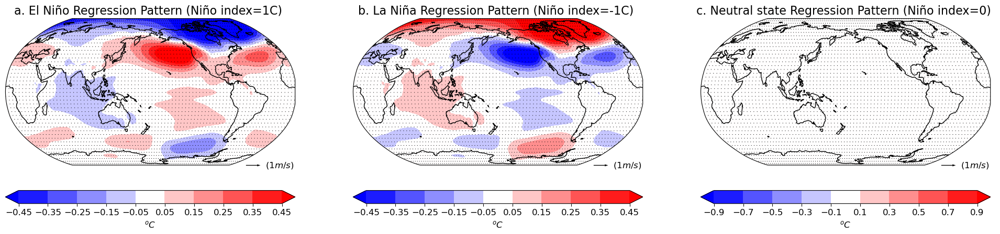

In [162]:

fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(20, 10))

ax = fig.add_subplot(1, 3, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.45,0.46,0.1)
h=plt.contourf(lon, lat, reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_UF[0::3,0::3],reg_VF[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern (Niño index=1C) ', fontsize=16)

####### La Niña

ax = fig.add_subplot(1, 3, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.45,0.46,0.1)
h=plt.contourf(lon, lat, -reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_UF[0::3,0::3],-reg_VF[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. La Niña Regression Pattern (Niño index=-1C) ', fontsize=16)

####### Neutral state composite

ax = fig.add_subplot(1, 3, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_F*0.00000000000001, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 0.00000000000001*reg_UF[0::3,0::3],0.00000000000001*reg_VF[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. Neutral state Regression Pattern (Niño index=0) ', fontsize=16)

fig.tight_layout()

In [164]:
PSL_FA_nino_asym=(1/2)*(PSL_FA_nino_composite+PSL_FA_nina_composite)
PSL_FA_nino_sym=(1/2)*(PSL_FA_nino_composite-PSL_FA_nina_composite)

UA_F_nino_asym=(1/2)*(UA_F_nino_composite+UA_F_nina_composite)
UA_F_nino_sym=(1/2)*(UA_F_nino_composite-UA_F_nina_composite)

VA_F_nino_asym=(1/2)*(VA_F_nino_composite+VA_F_nina_composite)
VA_F_nino_sym=(1/2)*(VA_F_nino_composite-VA_F_nina_composite)

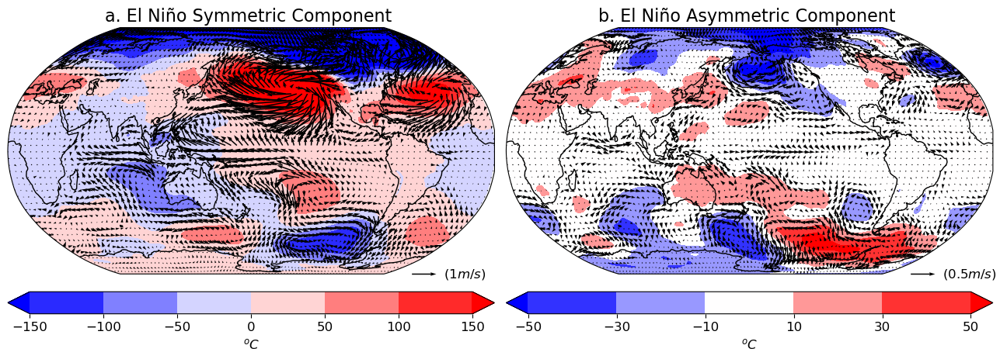

In [168]:
fontsize=12

#### To plot data
LON,LAT = np.meshgrid(lon, lat)

fig = plt.figure(figsize=(13, 5))

ax = fig.add_subplot(1, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-150,151,50)
h=plt.contourf(lon, lat, PSL_FA_nino_sym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_F_nino_sym[0::3,0::3],VA_F_nino_sym[0::3,0::3],transform=crs, scale=20)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Symmetric Component ', fontsize=16)

########

ax = fig.add_subplot(1, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-50,51,20)
h=plt.contourf(lon, lat, PSL_FA_nino_asym, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], UA_F_nino_asym[0::3,0::3],VA_F_nino_asym[0::3,0::3],transform=crs, scale=10)
ax.quiverkey(q, X=0.88, Y=0.0, U=0.5,label=r'$(0.5m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Asymmetric Component ', fontsize=16)

fig.tight_layout()

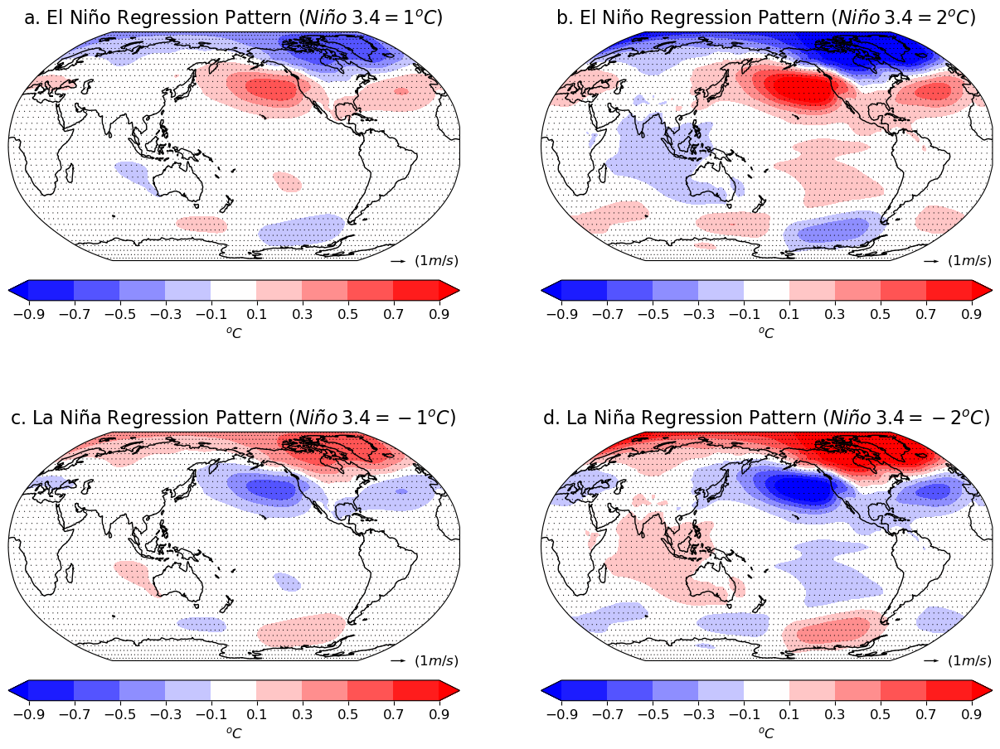

In [172]:
fig = plt.figure(figsize=(13, 10))

ax = fig.add_subplot(2, 2, 1, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], reg_UF[0::3,0::3],reg_VF[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'a. El Niño Regression Pattern ($Niño\:3.4=1^{o}C$) ', fontsize=16)

#########

ax = fig.add_subplot(2, 2, 2, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, 2*reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], 2*reg_UF[0::3,0::3],2*reg_VF[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'b. El Niño Regression Pattern ($Niño\:3.4=2^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 3, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -reg_UF[0::3,0::3],-reg_VF[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'c. La Niña Regression Pattern ($Niño\:3.4=-1^{o}C$) ', fontsize=16)

#############################

ax = fig.add_subplot(2, 2, 4, projection=ccrs.Robinson(central_longitude=180.0))
crs=ccrs.PlateCarree()

# make the map global rather than have it zoom in to
# the extents of any plotted data
# ax.set_global()

#ax.stock_img()
ax.coastlines()

contour_levels = np.arange(-0.9,0.91,0.2)
h=plt.contourf(lon, lat, -2*reg_PSL_F, transform=crs,cmap='bwr',levels=contour_levels, extend='both')

cbar = plt.colorbar(h, orientation='horizontal',pad=0.05)
cbar.ax.tick_params(labelsize=12)
cbar.set_label(r'$^{o}C$', fontsize=12)

##### Add wind data
###Thin this out a little bit
q=ax.quiver(LON[0::3,0::3], LAT[0::3,0::3], -2*reg_UF[0::3,0::3],-2*reg_VF[0::3,0::3],transform=crs, scale=30)
ax.quiverkey(q, X=0.88, Y=0.0, U=1,label=r'$(1m/s)$', labelpos='E',\
           color='k', fontproperties={'size': 'large'})

ax.set_title(r'd. La Niña Regression Pattern ($Niño\:3.4=-2^{o}C$) ', fontsize=16)

fig.tight_layout()